In [35]:
import hdbscan
import pandas as pd
import numpy as np
import ast
import seaborn as sns
import matplotlib.pyplot as plt
import networkx as nx
import module
import math

from matplotlib.colors import ListedColormap
from umap.umap_ import UMAP
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from pointgrid import align_points_to_grid
from sklearn.metrics.pairwise import cosine_similarity
from scipy.sparse import csr_matrix, lil_matrix, save_npz, load_npz
from collections import defaultdict

# Input

In [31]:
user_path = 'exp/full.csv'
df = pd.read_csv(user_path)

# Correctly read the lists and dictionaries
df = module.eval_as(df)

In [32]:
df.sample(1)

,Z30_CALL_NO,frequency,users,users_weighed,yearly_frequency,yearly_loan_time,title,is_outlier,yearly_frequency_norm,frequency_norm
3154,Bb 995-6130,2,"[U-156, U-528]","[U-156, U-528]",{2015: 2},{2015: 2.0},Arte italiana del terzo millennio,False,"{2016: 0.0, 2021: 0.0, 2018: 0.0, 2023: 0.0, 2...",0.002146


# Vectorizers



## Cosine Similarity

In [6]:
# Compute similarity depending on user loans
user_dummies = pd.get_dummies(df['users'].explode()).groupby(level=0).sum()
user_matrix = csr_matrix(user_dummies)

tfidf_transformer = TfidfTransformer()
tfidf_matrix = tfidf_transformer.fit_transform(user_dummies)

In [ ]:
# Sparse matrix format
similarity_matrix = cosine_similarity(tfidf_matrix)
similarity_matrix_csr = csr_matrix(similarity_matrix)

In [ ]:
# Export sparse matrix
# save_npz('exp/similarity_cos.npz', similarity_matrix_csr)
similarity_matrix_csr = load_npz('exp/similarity_cos.npz')

## Count vectorizer, tfidf vectorizer

In [22]:
count = CountVectorizer(input="content", lowercase=False, tokenizer=lambda key: key)

def identity_tokenizer(doc):
    return doc
    
tfidf = TfidfVectorizer(tokenizer = identity_tokenizer, preprocessor= identity_tokenizer, token_pattern=None)

users_count = count.fit_transform(df['users'])
users_weighed_count = count.fit_transform(df['users_weighed'])

users_tfidf = tfidf.fit_transform(df['users'])
users_weighed_tfidf = tfidf.fit_transform(df['users_weighed'])

/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


# Dimensionality reduction

In [9]:
reducer = UMAP(n_components=2)

users_weighed_count_emb = reducer.fit_transform(users_weighed_count)
# users_count_emb = reducer.fit_transform(users_count)
users_weighed_tfidf_emb = reducer.fit_transform(users_weighed_tfidf)
# users_tfidf_emb = reducer.fit_transform(users_tfidf)
# users_cosine_emb = reducer.fit_transform(similarity_matrix_csr)

/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable
  warn(
/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable
  warn(


In [5]:
def plot_embedding(embedding, title):
    plt.figure(figsize=(20, 15), dpi=300)
    plt.axis("off")
    plt.scatter(
        embedding[:, 0],
        embedding[:, 1],
        s=8,
        c='black'
    )
    # Add title in the top left corner
    title_text = title
    plt.text(0.05, 0.95, title_text, transform=plt.gca().transAxes, fontsize=16, ha='left', fontname='Helvetica')

# Effect of the Vectorizers

The different distance metrics on the loan data give different results for the mapping. In this plot the Umap was not parametrized to see which matrix holds visually the most clarity already. 

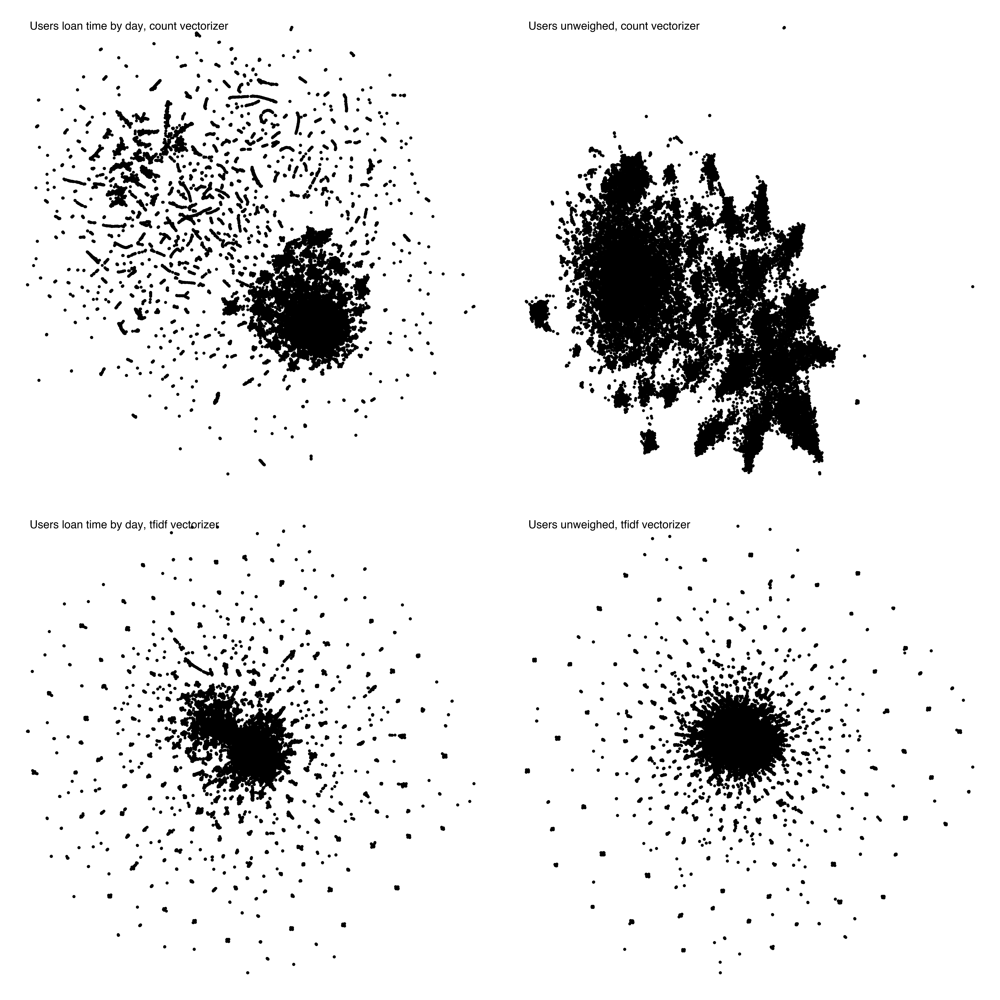

In [20]:
def plot_embeddings(embedding, title):
    plt.scatter(
        embedding[:, 0],
        embedding[:, 1],
        s=10,
        c='black'
    )
    
    title_text = title
    plt.text(0.05, 0.95, title_text, transform=plt.gca().transAxes, fontsize=16, ha='left', fontname='Helvetica')
    plt.axis('off')

plt.figure(figsize=(20, 20), dpi=300)
plt.subplot(2, 2, 1)
plot_embeddings(embedding=users_weighed_count_emb, title='Users loan time by day, count vectorizer')

plt.subplot(2, 2, 2)
plot_embeddings(embedding=users_count_emb, title='Users unweighed, count vectorizer')

plt.subplot(2, 2, 3)
plot_embeddings(embedding=users_weighed_tfidf_emb, title='Users loan time by day, tfidf vectorizer')

plt.subplot(2, 2, 4)
plot_embeddings(embedding=users_tfidf_emb, title='Users unweighed, tfidf vectorizer')

plt.tight_layout()
plt.show()


# Parametrization

Umap Parameters are very important for the visual clarity of the resulting embedding. In this seciton I go over several of the parameters. Due to long runtime the code was not executed in sequence and thus might appear a bit messy. 

In [24]:
%%time
metrics = ['jaccard', 'cosine', 'hamming'] #distance metric : hamming/jaccard good for categorical data
neighbors = [10, 50, 100] #balances local versus global structure
min_dist = [0.1, 0.5] #how tightly are points allowed to be packed together, low values mean tighter packing/clustering possible
embeddings = []

for k, metric in enumerate(metrics):
    for i, neighbor in enumerate(neighbors):
        for j, dist in enumerate(min_dist):
            
            umap_obj = UMAP(n_components=2, n_neighbors=neighbor, metric=metric, min_dist=dist)
            x_umap = umap_obj.fit_transform(users_weighed_tfidf)

            embeddings.append((umap_obj, x_umap))   

/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(
/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:125: UserWarning: A few of your vertices were disconnected from the manifold.  This shouldn't cause problems.
Disconnection_distance = 1 has removed 77994 edges.
It has only fully disconnected 6011 vertices.
Use umap.utils.disconnected_vertices() to identify them.
  warn(
/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/sklearn/metrics/pairwise.py:2025: DataConversionWarning: Data was converted to boolean for metric jaccard
  warnings.warn(msg, DataConversionWarning)
/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(
/Users/hana/anaconda3

CPU times: user 17h 19min 17s, sys: 20min 21s, total: 17h 39min 39s
Wall time: 2h 32min 41s


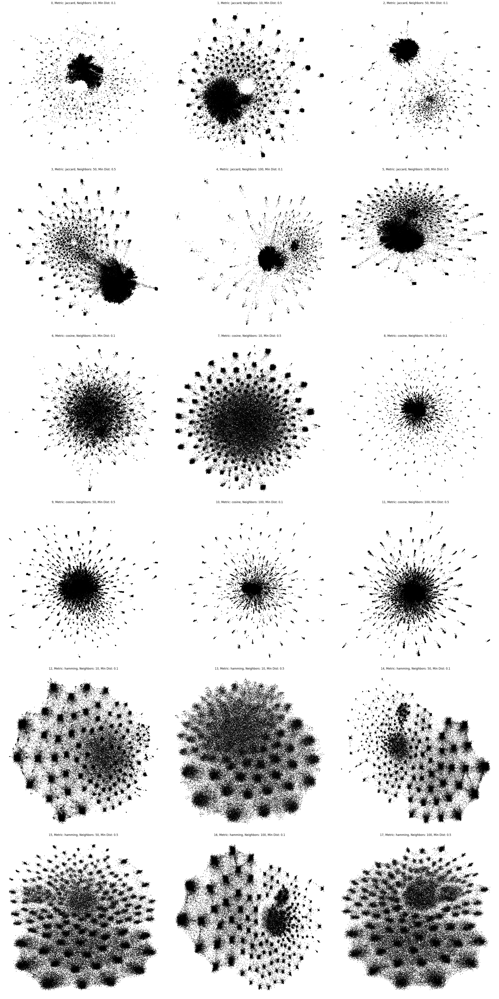

In [38]:
num_plots = len(embeddings)
num_cols = 3  
num_rows = math.ceil(num_plots / num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 10, num_rows * 10))

for index, ((umap_obj, x_umap), ax) in enumerate(zip(embeddings, axes.flatten())):
    
    title = f"{index}, Metric: {umap_obj.metric}, Neighbors: {umap_obj.n_neighbors}, Min Dist: {umap_obj.min_dist}"
    
    # Plot embedding
    ax.scatter(x_umap[:, 0], x_umap[:, 1], s=1, c='black')

    title_text = title
    ax.set_title(title)    
    ax.axis('off')

for i in range(index + 1, num_rows * num_cols):
    axes.flatten()[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
for index, (umap_obj, x_umap) in enumerate(embeddings):
    # Construct a file name based on the index or parameters
    file_name = f"exp/embeddings/embedding_{index}.npy"
    # Save the embedding
    np.save(file_name, x_umap)

# Parametrization Results

These two plots are the results of the following parameters for the umap: metric = hamming, n_neighbors= 100, min_dist = 0.1

These parameters were selected 
- to allow tight packing of points in order to create clear clusters
- to balance global versus local structure well

In [10]:
reducer = UMAP(n_components=2, metric='hamming', n_neighbors=100)

# users_weighed_count_emb = reducer.fit_transform(users_weighed_count)
users_weighed_tfidf_emb = reducer.fit_transform(users_weighed_tfidf)
# users_tfidf_emb = reducer.fit_transform(users_tfidf)

/Users/hana/anaconda3/envs/data/lib/python3.10/site-packages/umap/umap_.py:1802: UserWarning: gradient function is not yet implemented for hamming distance metric; inverse_transform will be unavailable
  warn(


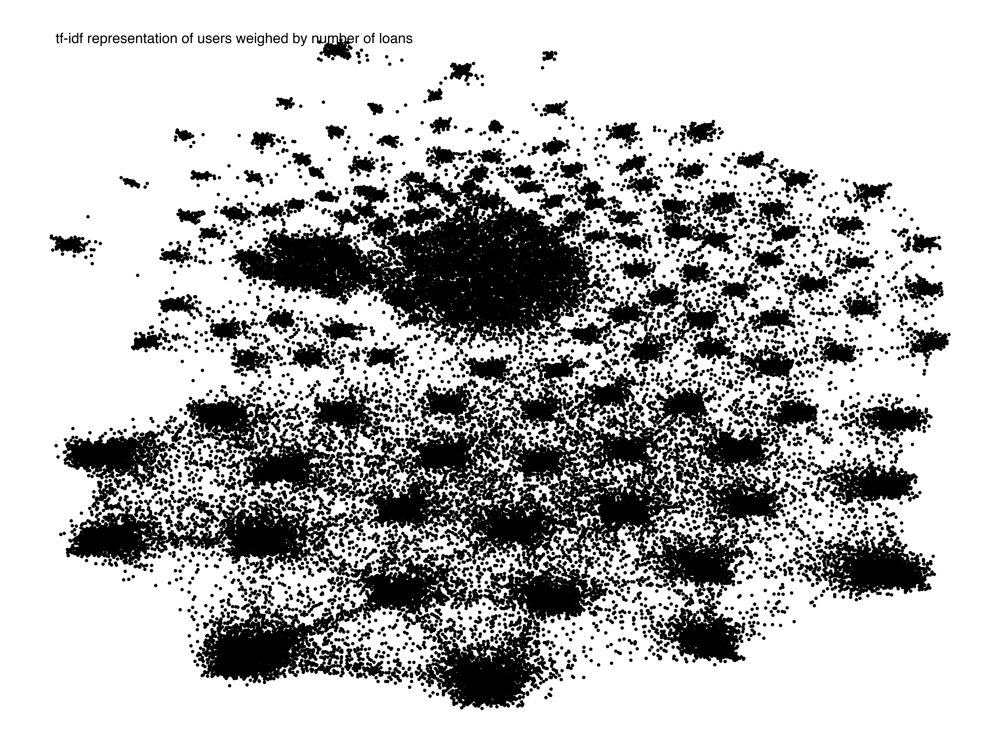

In [11]:
# np.save('exp/tfidf_weighed_embedding.npy', users_weighed_tfidf_emb)
users_weighed_tfidf_emb = np.load('exp/tfidf_weighed_embedding.npy')
plot_embedding(embedding=users_weighed_tfidf_emb, title = 'tf-idf representation of users weighed by number of loans')

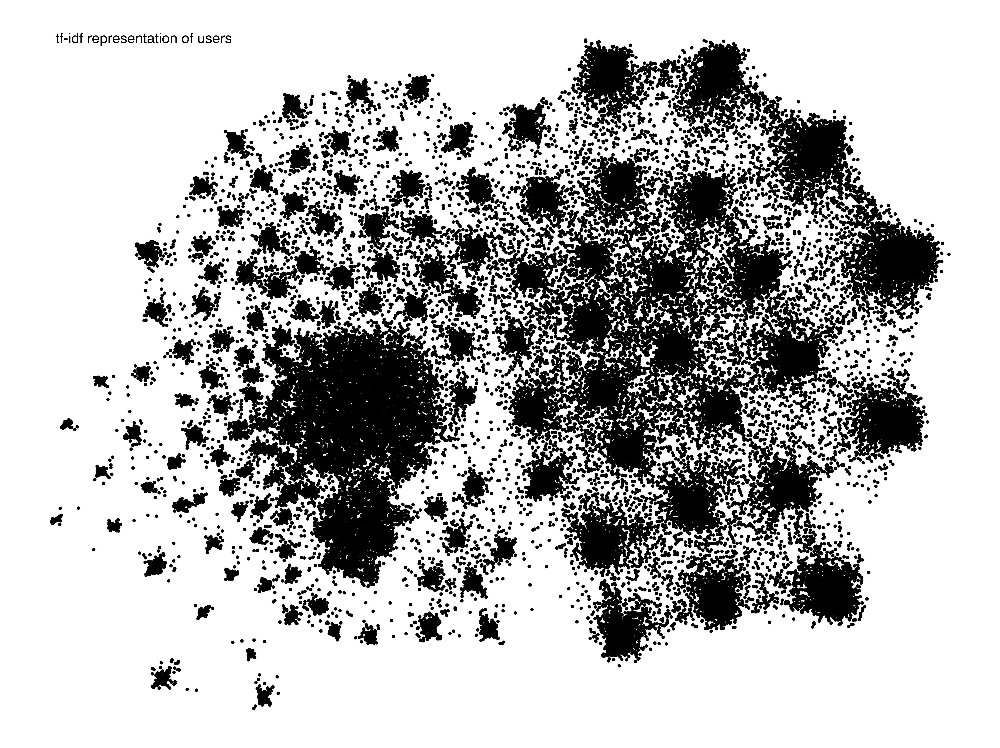

In [7]:
# np.save('exp/tfidf_embedding.npy', users_tfidf_emb)
users_tfidf_emb = np.load('exp/tfidf_embedding.npy')
plot_embedding(embedding=users_tfidf_emb, title = 'tf-idf representation of users')

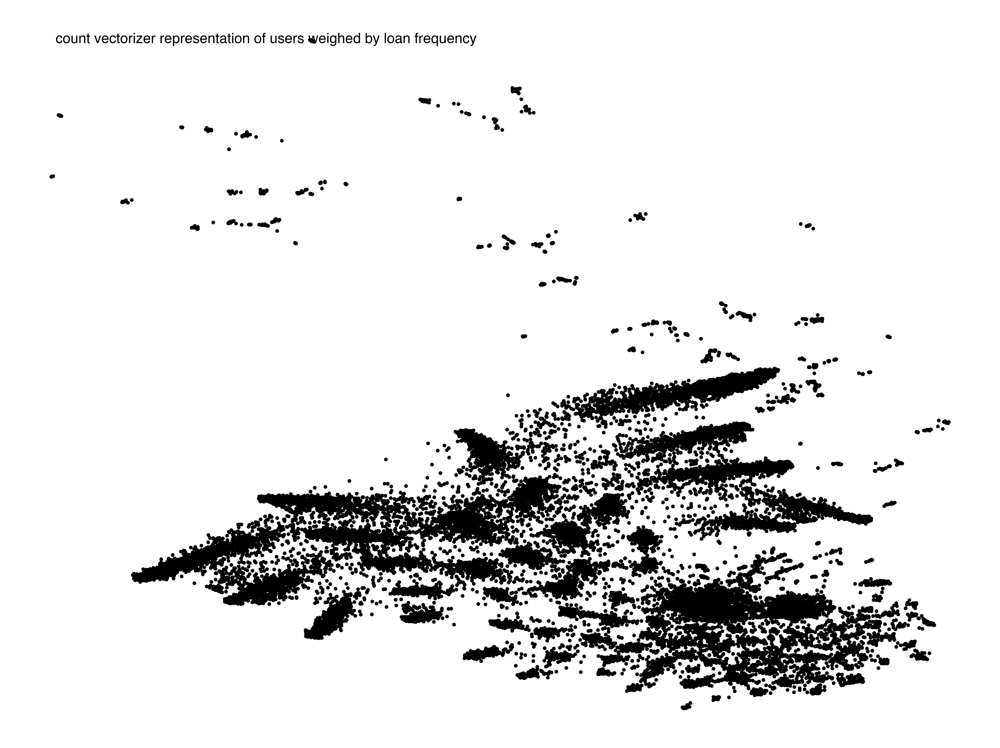

In [26]:
# np.save('exp/parametrized_count_embedding.npy', users_weighed_count_emb)
parametrized_embedding_count = np.load('exp/parametrized_count_embedding.npy')
plot_embedding(embedding=parametrized_embedding_count, title = 'count vectorizer representation of users weighed by loan frequency')


# Normalization

In [12]:
embedding = users_weighed_tfidf_emb
# embedding = users_weighed_count_emb

# Scale embedding 
range = (100, 900)
scaler = MinMaxScaler(feature_range=range)  # Scale
embedding = scaler.fit_transform(embedding)
embedding = embedding.astype(int)

df = df.assign(x=embedding[:, 0], y=embedding[:, 1])

In [14]:
df.sample()

,Z30_CALL_NO,frequency,users,users_weighed,yearly_frequency,yearly_loan_time,title,is_outlier,yearly_frequency_norm,frequency_norm,x,y
57793,KatE-PAR 3650-1913/1,1,[U-156],[U-156],{2013: 1},{2013: 1.0},5e Exposition des arts de l'Asie,False,"{2016: 0.0, 2021: 0.0, 2018: 0.0, 2023: 0.0, 2...",0.0,239,444


# Clustering

In [15]:
hdb = hdbscan.HDBSCAN(
    # min_samples=1,
     min_cluster_size=20,  # 2 — which means 3 elements — is the smallest cluster size
    cluster_selection_epsilon=5,   # float, optional (default=0.0) A distance threshold. Clusters below this value will be merged.
    # gen_min_span_tree=False,
    # leaf_size=10, # int, optional (default=40) If using a space tree algorithm (kdtree, or balltree) the number of points ina leaf node of the tree. This does not alter the resulting clustering, but may have an effect on the runtime of the algorithm.
)
embedding = df[['x', 'y']].to_numpy()
hdb.fit(embedding)
clusters = hdb.labels_

df['cluster'] = clusters
df.sample()

,Z30_CALL_NO,frequency,users,users_weighed,yearly_frequency,yearly_loan_time,title,is_outlier,yearly_frequency_norm,frequency_norm,x,y,cluster
31766,E-BAG 60-5800,2,"[U-181, U-143]","[U-143, U-181]","{2016: 1, 2017: 1}","{2016: 1.0, 2017: 1.0}",Bagnaia,False,"{2016: 0.008, 2021: 0.0, 2018: 0.0, 2023: 0.0,...",0.002146,366,448,131


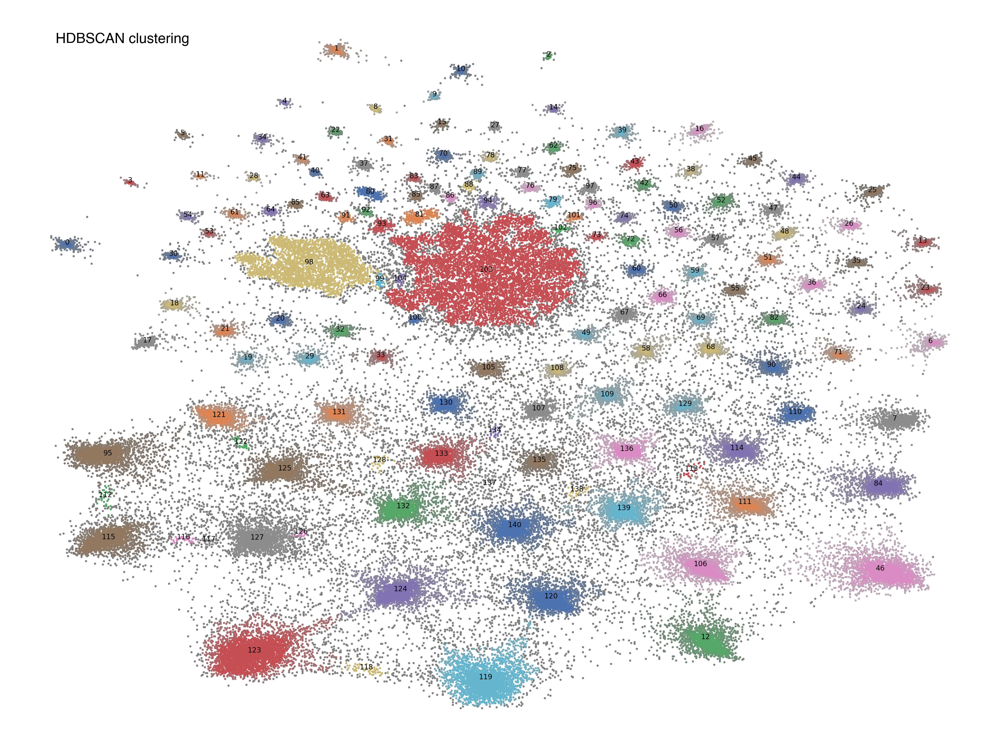

In [16]:
# Colour the points depending on how probably they belong to the cluster
color_palette = sns.color_palette('deep', 500)
cluster_colors = [color_palette[x] if x >= 0
                  else (0.5, 0.5, 0.5)
                  for x in hdb.labels_]
cluster_member_colors = [sns.desaturate(x, p) for x, p in
                         zip(cluster_colors, hdb.probabilities_)]


plt.figure(figsize=(20, 15), dpi=300)
plt.scatter(df['x'], df['y'], s = 2, c=cluster_member_colors)

for cluster_number in np.unique(hdb.labels_):
    if cluster_number == -1:
        continue  # Skip unclustered points
    
    # Add cluster number over centroid
    cluster_indices = np.where(hdb.labels_ == cluster_number)[0]
    cluster_x = df.iloc[cluster_indices]['x'].mean()
    cluster_y = df.iloc[cluster_indices]['y'].mean()
    plt.text(cluster_x, cluster_y, f'{cluster_number}', fontsize=8, ha='center')


title_text = 'HDBSCAN clustering'
plt.text(0.05, 0.95, title_text, transform=plt.gca().transAxes, fontsize=16, ha='left', fontname='Helvetica')
plt.axis('off')
plt.show()

In [20]:
# df.to_csv('exp/arrangement_tfidf.csv', index=False)
# df.to_csv('exp/arrangement_cos.csv', index=False)
# df.to_csv('exp/arrangement_count.csv', index=False)
df.to_csv('exp/arrangement_weighed.csv', index=False)